In [ ]:
!pip install -q diffusers transformers accelerate peft
!pip install -U torchmetrics
!pip install torch torchvision transformers scipy safetensors

In [ ]:
from diffusers import StableDiffusionXLPipeline
import torch
from diffusers import AutoPipelineForText2Image
from diffusers import DPMSolverMultistepScheduler



#### Based on the following models (SDXL turbo, SDXL base, ByteDance/SDXL-Lightning(2-Step, 4-Step, 8-Step UNet), ByteDance/SDXL-Lightning(2-Step, 4-Step, 8-Step LoRA)

Based on to the CLIP Score, the best model is ByteDance/SDXL-Lightning(2-Step, 4-Step, 8-Step UNet)

In [ ]:
### Enter Your Prompt
prompt = ""
negative_prompt=""

In [ ]:
### Run to generate image
import torch
from diffusers import StableDiffusionXLPipeline, EulerDiscreteScheduler
from huggingface_hub import hf_hub_download

base = "stabilityai/stable-diffusion-xl-base-1.0"
repo = "ByteDance/SDXL-Lightning"
ckpt = "sdxl_lightning_4step_lora.safetensors" # Use the correct ckpt for your step setting!

# Load model.
pipe = StableDiffusionXLPipeline.from_pretrained(base, torch_dtype=torch.float16, variant="fp16").to("cuda")
pipe.load_lora_weights(hf_hub_download(repo, ckpt))
pipe.fuse_lora()

# Ensure sampler uses "trailing" timesteps.
pipe.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config, timestep_spacing="trailing")

generator = torch.Generator("cuda").manual_seed(45)
image=pipe(prompt,negative_prompt=negative_prompt, num_inference_steps=4, guidance_scale=0,generator=generator).images[0]
print(image)
image

# Models and their respective images are as following:

# +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

## SDXL turbo:

In [ ]:
pipeline = StableDiffusionXLPipeline.from_single_file(
    "https://huggingface.co/stabilityai/sdxl-turbo/blob/main/sd_xl_turbo_1.0_fp16.safetensors", torch_dtype=torch.float16,use_safetensors=True)
pipeline = pipeline.to("cuda")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
from diffusers import DPMSolverMultistepScheduler

pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)

  0%|          | 0/20 [00:00<?, ?it/s]

<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7E0909C92B00>


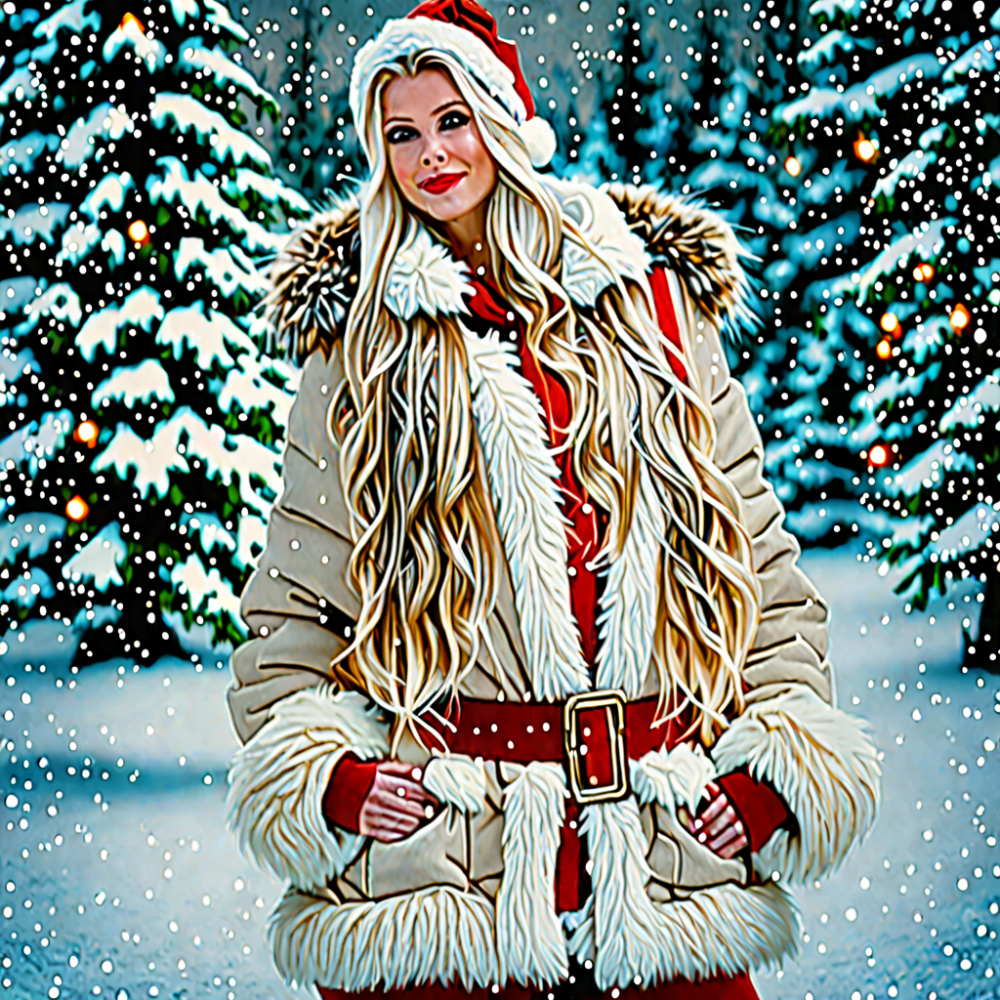

In [ ]:
prompt="realistic,little blond Santa Clause girl, alligned eyes ++,25 years old , snow, winter, photo,full body shot, long fur,long hair, beautiful++ cinematic, quality, realistic, (happy:1.3), standing"
negative_prompt="(deformed iris, deformed pupils, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime, mutated hands and fingers:1.4), (deformed, distorted, disfigured:1.3), poorly drawn, bad anatomy, wrong anatomy, extra limb, missing limb, floating limbs, disconnected limbs, mutation, mutated, ugly, disgusting, amputation"
generator = torch.Generator("cuda").manual_seed(845)

image = pipeline(prompt,negative_prompt=negative_prompt, num_inference_steps=20, generator=generator).images[0]

print(image)
image.save("image.png")

image


In [ ]:
prompts = [
    "a photo of an astronaut riding a horse on mars",
    "A high tech solarpunk utopia in the Amazon rainforest",
    "A pikachu fine dining with a view to the Eiffel Tower"
]

images = pipeline(prompts, num_images_per_prompt=1, output_type="np").images

print(images.shape)


from torchmetrics.functional.multimodal import clip_score
from functools import partial

clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")

def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)

sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")
# CLIP score: 37.4986

  0%|          | 0/50 [00:00<?, ?it/s]

(3, 1024, 1024, 3)


config.json:   0%|          | 0.00/4.10k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

CLIP score: 37.4986


# +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

## SDXL base:

In [ ]:
from diffusers import AutoPipelineForText2Image


pipeline = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, variant="fp16",use_safetensors=True
).to("cuda")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7E66ACDAF130>


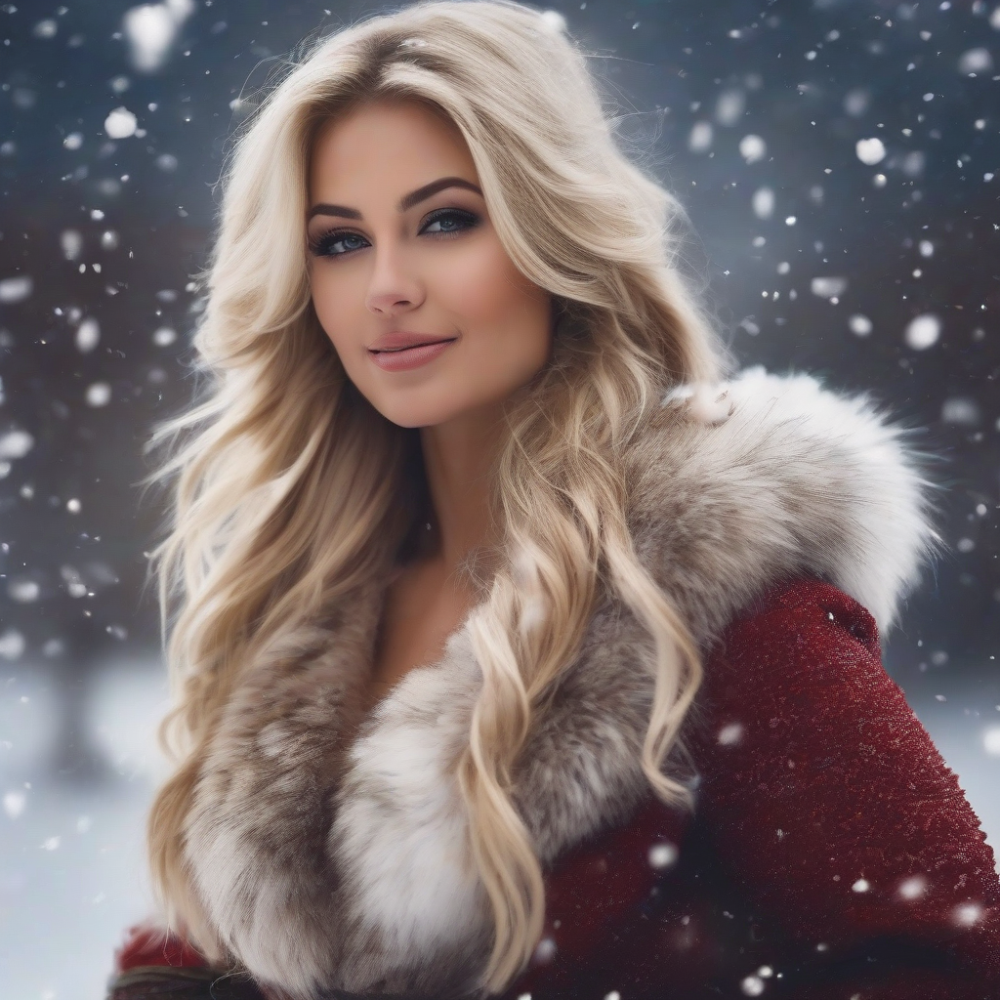

In [ ]:
prompt="little blond Santa Clause girl, 25 years old , snow, winter, photo, fullbody shot++++, long fur,long hair, beautiful++ cinematic, quality, realistic, (happy:1.3), standing"
negative_prompt="(deformed iris, deformed pupils, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime, mutated hands and fingers:1.4), (deformed, distorted, disfigured:1.3), poorly drawn, bad anatomy, wrong anatomy, extra limb, missing limb, floating limbs, disconnected limbs, mutation, mutated, ugly, disgusting, amputation"
generator = torch.Generator("cuda").manual_seed(845)

image = pipeline(prompt,negative_prompt=negative_prompt, num_inference_steps=20, generator=generator).images[0]
print(image)
image

  0%|          | 0/20 [00:00<?, ?it/s]

<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7E6690ED4F70>


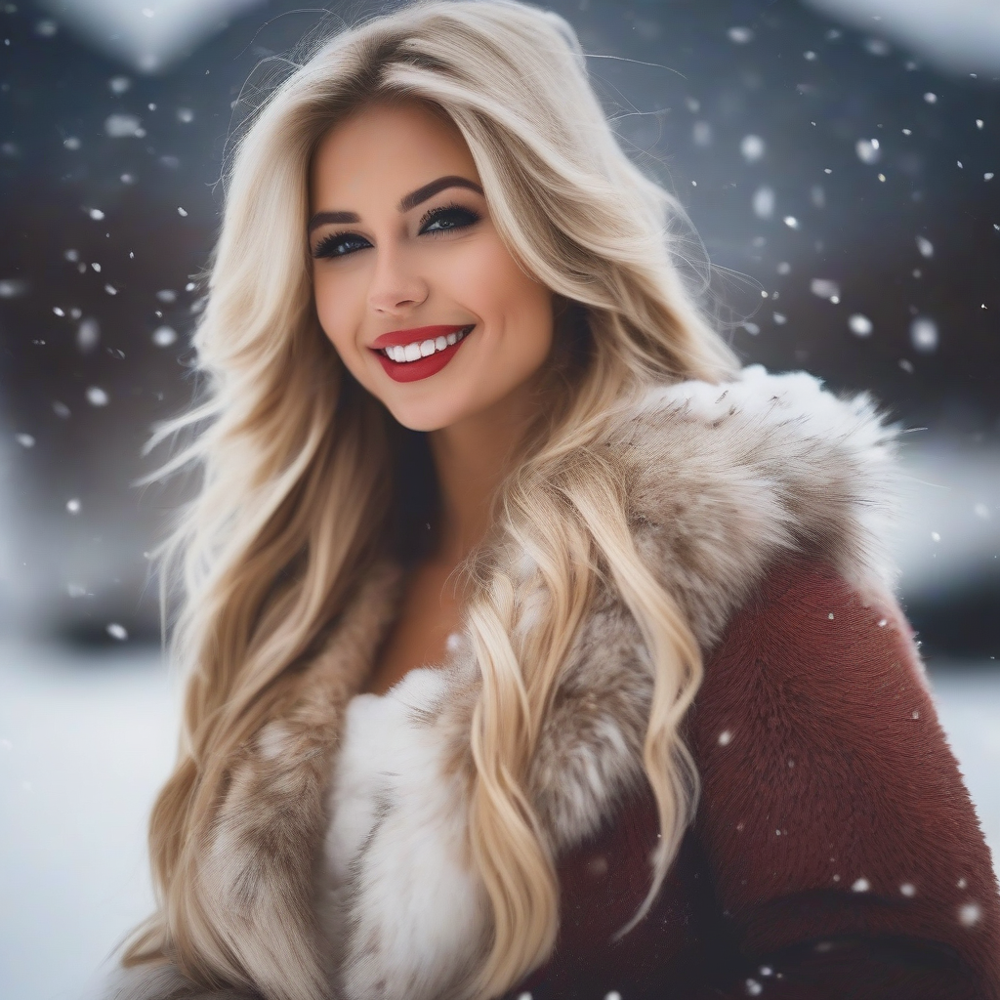

In [ ]:
# added guidance scale

prompt="little blond Santa Clause girl, 25 years old , snow, winter, photo, portrait, long fur,long hair, beautiful++ cinematic, quality, realistic, (happy:1.3), standing"
negative_prompt="(deformed iris, deformed pupils, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime, mutated hands and fingers:1.4), (deformed, distorted, disfigured:1.3), poorly drawn, bad anatomy, wrong anatomy, extra limb, missing limb, floating limbs, disconnected limbs, mutation, mutated, ugly, disgusting, amputation"
generator = torch.Generator("cuda").manual_seed(845)

image = pipeline(prompt,negative_prompt=negative_prompt, num_inference_steps=20, guidance_scale=7.5,generator=generator).images[0]
print(image)
image

In [ ]:
prompts = [
    "a photo of an astronaut riding a horse on mars",
    "A high tech solarpunk utopia in the Amazon rainforest",
    "A pikachu fine dining with a view to the Eiffel Tower"
]

images = pipeline(prompts, num_images_per_prompt=1, output_type="np").images

print(images.shape)


from torchmetrics.functional.multimodal import clip_score
from functools import partial

clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")

def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)

sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")
# CLIP score: 36.9449

  0%|          | 0/50 [00:00<?, ?it/s]

(3, 1024, 1024, 3)
CLIP score: 36.9449


  0%|          | 0/20 [00:00<?, ?it/s]

<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7E6690EC8160>


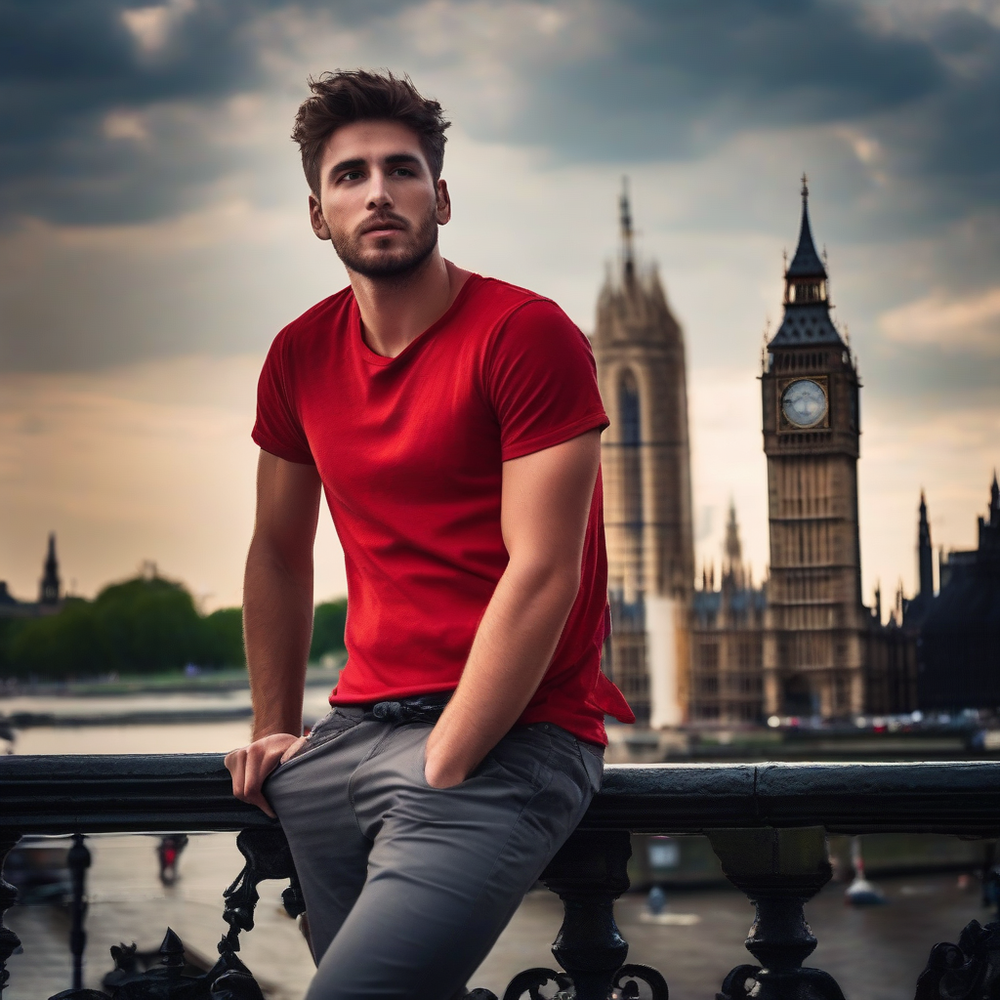

In [ ]:

prompt = "cinematic photo photograph, high quality, 25 y.o man,proper alighned eyes++++,looking into the camera++,wearing red shirt,complete body visible,  film, bokeh, professional, 4k, highly detailed, a look of shock,standing in froont of big ben"
negative_prompt="(deformed iris+++, deformed pupils+++, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime, mutated hands and fingers:1.4), (deformed, distorted, disfigured:1.3), poorly drawn, bad anatomy, wrong anatomy, extra limb, missing limb, floating limbs, disconnected limbs, mutation, mutated, ugly, disgusting, amputation,lowres, distorted limbs,improper iris, disalgihned eyes,text, error, cropped, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, out of frame, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, bad proportions, extra limbs, cloned face, disfigured, gross proportions, malformed limbs, missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck, username, watermark, signature"
generator = torch.Generator("cuda").manual_seed(845)

image = pipeline(prompt,negative_prompt=negative_prompt, num_inference_steps=20, guidance_scale=7.5,generator=generator).images[0]
print(image)
image

# +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

## ByteDance/SDXL-Lightning:

#### 2-Step, 4-Step, 8-Step UNet:

In [ ]:
import torch
from diffusers import StableDiffusionXLPipeline, UNet2DConditionModel, EulerDiscreteScheduler
from huggingface_hub import hf_hub_download
from safetensors.torch import load_file

base = "stabilityai/stable-diffusion-xl-base-1.0"
repo = "ByteDance/SDXL-Lightning"
ckpt = "sdxl_lightning_4step_unet.safetensors" # Use the correct ckpt for your step setting!

# Load model.
unet = UNet2DConditionModel.from_config(base, subfolder="unet").to("cuda", torch.float16)
unet.load_state_dict(load_file(hf_hub_download(repo, ckpt), device="cuda"))
pipe = StableDiffusionXLPipeline.from_pretrained(base, unet=unet, torch_dtype=torch.float16, variant="fp16").to("cuda")

# Ensure sampler uses "trailing" timesteps.
pipe.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config, timestep_spacing="trailing")




/usr/local/lib/python3.10/dist-packages/diffusers/configuration_utils.py:244: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a model, please use <class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>.load_config(...) followed by <class 'diffusers.models.unets.unet_2d_condition.UNet2DConditionModel'>.from_config(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all o

sdxl_lightning_4step_unet.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7C095FD27FA0>


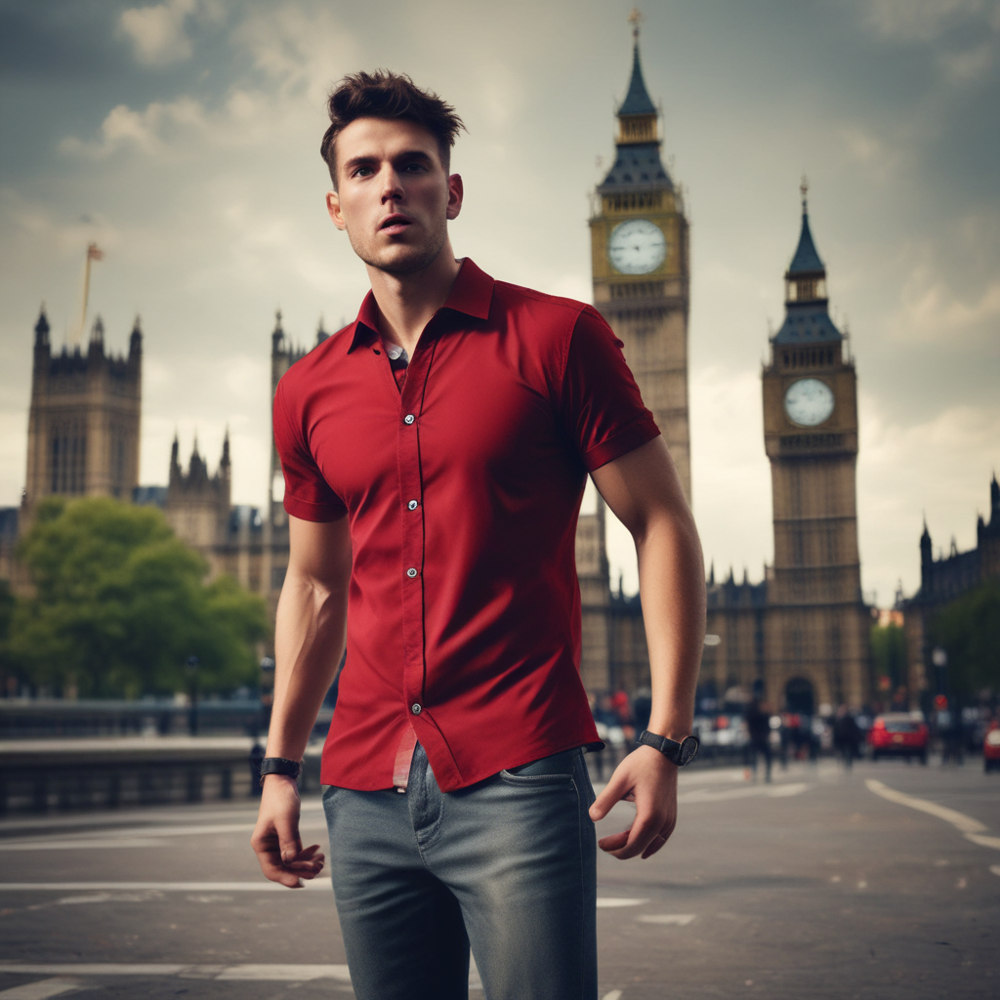

In [ ]:
# Ensure using the same inference steps as the loaded model and CFG set to 0.
prompt = "cinematic photo photograph, high quality, 25 y.o man,proper alighned eyes++++,looking into the camera++,wearing red shirt,complete body visible++++++,  film, bokeh, professional, 4k, highly detailed, a look of shock,standing in froont of big ben"
negative_prompt="(deformed iris+++, deformed pupils+++, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime, mutated hands and fingers:1.4), (deformed, distorted, disfigured:1.3), poorly drawn, bad anatomy, wrong anatomy, extra limb, missing limb, floating limbs, disconnected limbs, mutation, mutated, ugly, disgusting, amputation,lowres, distorted limbs,improper iris, disalgihned eyes,text, error, cropped, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, out of frame, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, bad proportions, extra limbs, cloned face, disfigured, gross proportions, malformed limbs, missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck, username, watermark, signature"
generator = torch.Generator("cuda").manual_seed(845)
image=pipe(prompt,negative_prompt=negative_prompt, num_inference_steps=4, guidance_scale=0,generator=generator).images[0]
print(image)
image


In [ ]:
prompts = [
    "a photo of an astronaut riding a horse on mars",
    "A high tech solarpunk utopia in the Amazon rainforest",
    "A pikachu fine dining with a view to the Eiffel Tower"
]

images = pipe(prompts, num_images_per_prompt=1, output_type="np").images

print(images.shape)


from torchmetrics.functional.multimodal import clip_score
from functools import partial

clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")

def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)

sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")
# CLIP score: 38.3768

  0%|          | 0/50 [00:00<?, ?it/s]

(3, 1024, 1024, 3)


/usr/local/lib/python3.10/dist-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


CLIP score: 38.3768


# +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

#### 2-Step, 4-Step, 8-Step LoRA:

In [ ]:
import torch
from diffusers import StableDiffusionXLPipeline, EulerDiscreteScheduler
from huggingface_hub import hf_hub_download

base = "stabilityai/stable-diffusion-xl-base-1.0"
repo = "ByteDance/SDXL-Lightning"
ckpt = "sdxl_lightning_4step_lora.safetensors" # Use the correct ckpt for your step setting!

# Load model.
pipe = StableDiffusionXLPipeline.from_pretrained(base, torch_dtype=torch.float16, variant="fp16").to("cuda")
pipe.load_lora_weights(hf_hub_download(repo, ckpt))
pipe.fuse_lora()

# Ensure sampler uses "trailing" timesteps.
pipe.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config, timestep_spacing="trailing")



Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

sdxl_lightning_4step_lora.safetensors:   0%|          | 0.00/394M [00:00<?, ?B/s]

  0%|          | 0/4 [00:00<?, ?it/s]

<PIL.Image.Image image mode=RGB size=1024x1024 at 0x7C098E86F310>


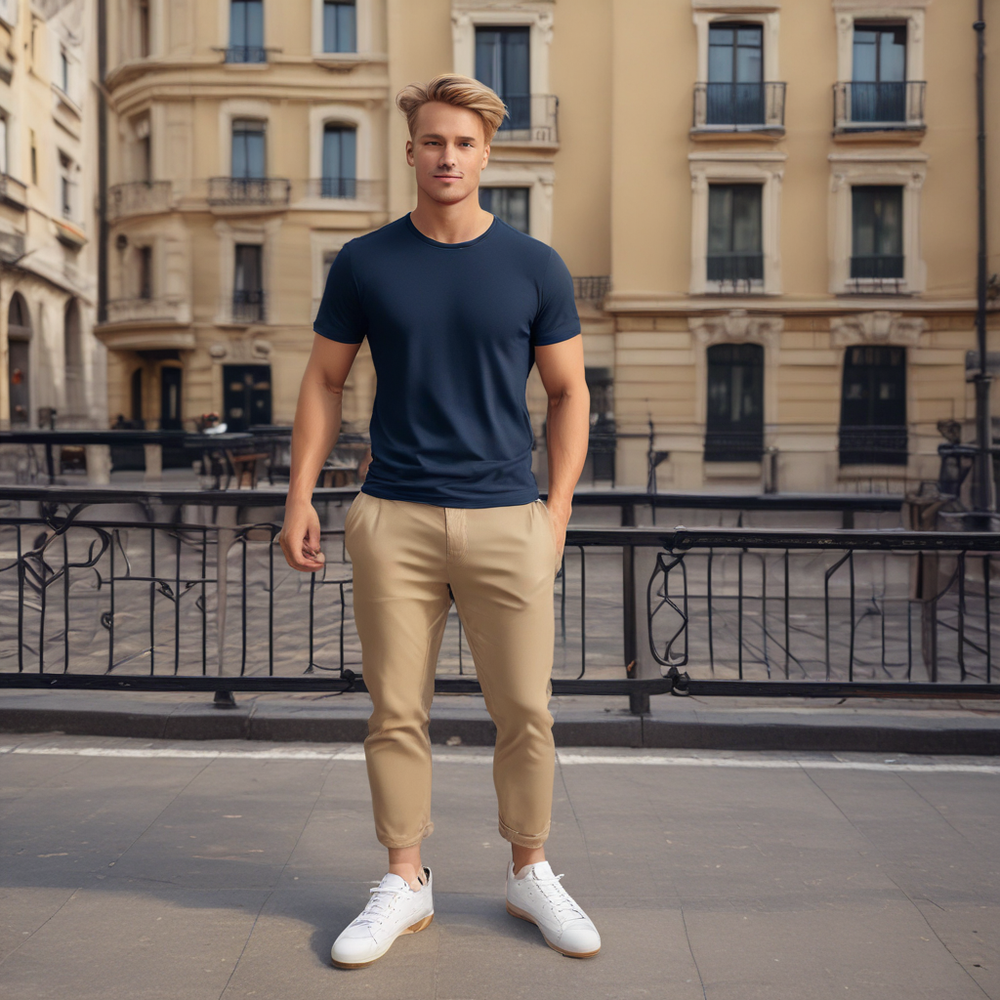

In [ ]:
# Ensure using the same inference steps as the loaded model and CFG set to 0.
prompt = "Stunning and elegant young-looking man with honey-colored hair and eyes looking at the camera wearing a navy blue t-shirt and dark beige twill pants with white FILA sneakers, masterpiece, best quality, (((full body visible))), direct sunlight, ultra detailed, realistic person, adobe photoshop, shot on a professional camera, london background, 8k"
negative_prompt="(deformed iris+++, deformed pupils+++, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime, mutated hands and fingers:1.4), (deformed, distorted, disfigured:1.3), poorly drawn, bad anatomy, wrong anatomy, extra limb, missing limb, floating limbs, disconnected limbs, mutation, mutated, ugly, disgusting, amputation,lowres, distorted limbs,improper iris, disalgihned eyes,text, error, cropped, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, out of frame, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, bad proportions, extra limbs, cloned face, disfigured, gross proportions, malformed limbs, missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck, username, watermark, signature"
generator = torch.Generator("cuda").manual_seed(45)
image=pipe(prompt,negative_prompt=negative_prompt, num_inference_steps=4, guidance_scale=0,generator=generator).images[0]
print(image)
image


In [ ]:
prompts = [
    "a photo of an astronaut riding a horse on mars",
    "A high tech solarpunk utopia in the Amazon rainforest",
    "A pikachu fine dining with a view to the Eiffel Tower"
]

images = pipe(prompts, num_images_per_prompt=1, output_type="np").images

print(images.shape)


from torchmetrics.functional.multimodal import clip_score
from functools import partial

clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")

def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)

sd_clip_score = calculate_clip_score(images, prompts)
print(f"CLIP score: {sd_clip_score}")
# CLIP score: 37.6982

  0%|          | 0/50 [00:00<?, ?it/s]

(3, 1024, 1024, 3)
CLIP score: 37.6982
